### Libraries

In [1]:
import folium
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
sns.color_palette("Paired", as_cmap=True)
sns.set_style("whitegrid")

<br />

### Provinces

In [11]:
provinces = gpd.read_file('vietnam_adm2.json')
provinces.crs = "epsg:4326"

In [12]:
provinces.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 64 entries, 0 to 63
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   id        64 non-null     object  
 1   name_vi   64 non-null     object  
 2   name_en   64 non-null     object  
 3   type_vi   64 non-null     object  
 4   type_en   64 non-null     object  
 5   geometry  64 non-null     geometry
dtypes: geometry(1), object(5)
memory usage: 3.1+ KB


In [13]:
provinces.head()

,id,name_vi,name_en,type_vi,type_en,geometry
0,1,Đồng Tháp,Dong Thap,Tỉnh,Province,"POLYGON ((105.49772 10.95407, 105.49846 10.952..."
1,2,An Giang,An Giang,Tỉnh,Province,"POLYGON ((105.18714 10.91106, 105.18714 10.908..."
2,3,Bạc Liêu,Bac Lieu,Tỉnh,Province,"POLYGON ((105.3732 9.59704, 105.37393 9.59556,..."
3,4,Bến Tre,Ben Tre,Tỉnh,Province,"MULTIPOLYGON (((106.63825 9.81951, 106.63752 9..."
4,5,Cần Thơ,Can Tho,Thành phố trực thuộc tỉnh,City|Municipality|Thanh Pho,"POLYGON ((105.49479 10.32524, 105.49626 10.323..."


In [14]:
provinces['name_en'].tolist()
#provinces.loc[:, 'name_en']

['Dong Thap',
 'An Giang',
 'Bac Lieu',
 'Ben Tre',
 'Can Tho',
 'Ca Mau',
 'Hau Giang',
 'Kien Giang',
 'Long An',
 'Soc Trang',
 'Tien Giang',
 'Tra Vinh',
 'Vinh Long',
 'Bac Ninh',
 'Hai Duong',
 'Hai Phong City|Haiphong',
 'Hung Yen',
 'Ha Noi City|Hanoi',
 'Ha Nam',
 'Ha Tay',
 'Nam Dinh',
 'Ninh Binh',
 'Thai Binh',
 'Vinh Phuc',
 'Bac Giang',
 'Bac Kan|Bac Can',
 'Cao Bang',
 'Ha Giang',
 'Lang Son',
 'Lao Cai',
 'Phu Tho',
 'Quang Ninh',
 'Thai Nguyen',
 'Tuyen Quang',
 'Yen Bai',
 'Dong Nai',
 'Ba Ria - Vung Tau',
 'Binh Duong',
 'Binh Phuoc',
 'Binh Thuan',
 'Ho Chi Minh City|Ho Chi Minh',
 'Ninh Thuan',
 'Tay Ninh',
 'Ha Tinh',
 'Nghe An',
 'Quang Binh',
 'Quang Tri',
 'Thua Thien - Hue',
 'Thanh Hoa',
 'Da Nang City|Da Nang',
 'Binh Dinh',
 'Khanh Hoa',
 'Phu Yen',
 'Quang Nam',
 'Quang Ngai',
 'Dien Bien',
 'Hoa Binh',
 'Lai Chau',
 'Son La',
 'Dak Lak|Dac Lac',
 'Dac Nong',
 'Gia Lai',
 'Kon Tum',
 'Lam Dong']

In [ ]:
provinces[provinces['name_en'] == 'Ha Tay'].plot()

### Affected Areas

Source: https://www.unocha.org/publications/report/viet-nam/viet-nam-typhoon-yagi-and-floods-situation-update-no-3-14-september-2024

In [15]:
provinces_list = ['Hai Phong City|Haiphong', 'Quang Ninh', 
                  'Lao Cai', 
                  'Cao Bang', 'Bac Kan|Bac Can', 'Lang Son', 'Bac Giang', 'Yen Bai', 'Bac Ninh', 
                  'Ha Giang', 'Tuyen Quang', 'Son La', 'Hoa Binh', 'Hung Yen',
                  'Lai Chau', 'Dien Bien', 'Phu Tho', 'Vinh Phuc', 'Thai Nguyen', 'Ha Noi City|Hanoi', 'Ha Tay', 
                  'Ha Nam', 'Nam Dinh', 'Ninh Binh', 'Thanh Hoa', 'Nghe An', 'Ha Tinh']

In [18]:
damaged_provinces = provinces[provinces['name_en'].isin(provinces_list)] 
damaged_provinces.crs = "epsg:4326"

<Axes: >

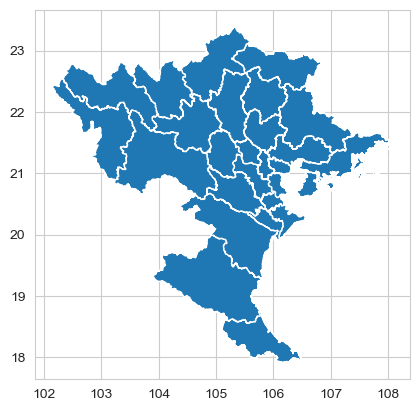

In [22]:
damaged_provinces.plot()

<br />

#### Folium

In [36]:
m = folium.Map(width=800, height=540, location=[20.6, 105.22], zoom_start=7)
folium.GeoJson(damaged_provinces).add_to(m)
m

### Damage

In [46]:
viet_damage = pd.read_csv("viet_damage.csv")

In [47]:
viet_damage.head()

,Area,Total_Damaged_Houses
0,Quang Ninh,12500
1,Hai Phong City|Haiphong,12500
2,Lao Cai,7500
3,Cao Bang,2500
4,Bac Kan|Bac Can,2500


In [48]:
from branca.colormap import linear

colormap = linear.RdPu_05.scale(
    viet_damage.Total_Damaged_Houses.min(), viet_damage.Total_Damaged_Houses.max()
)

print(colormap(5.0))

colormap

#feebe2ff


In [49]:
viet_damage_dict = viet_damage.set_index("Area")["Total_Damaged_Houses"]

viet_damage_dict

Area
Quang Ninh                 12500
Hai Phong City|Haiphong    12500
Lao Cai                     7500
Cao Bang                    2500
Bac Kan|Bac Can             2500
Lang Son                    2500
Bac Giang                   2500
Yen Bai                     2500
Bac Ninh                    2500
Ha Giang                     750
Tuyen Quang                  750
Son La                       750
Hoa Binh                     750
Hung Yen                     750
Lai Chau                     250
Dien Bien                    250
Phu Tho                      250
Vinh Phuc                    250
Thai Nguyen                  250
Ha Noi City|Hanoi            250
Ha Tay                       250
Ha Nam                       250
Nam Dinh                     250
Ninh Binh                    250
Thanh Hoa                    250
Nghe An                      250
Ha Tinh                      250
Name: Total_Damaged_Houses, dtype: int64

In [54]:
m = folium.Map(width=800, height=540, location=[20.6, 105.22], zoom_start=7)

folium.GeoJson(
    damaged_provinces,
    name="viet_damage",
    style_function=lambda feature: {
        "fillColor": colormap(viet_damage_dict[feature["properties"]["name_en"]]),
        "color": "black",
        "weight": 1,
        "dashArray": "5, 5",
        "fillOpacity": 0.7,
    },
).add_to(m)

folium.LayerControl().add_to(m)

m